<a href="https://colab.research.google.com/github/smshozab/FieldMatrix/blob/main/FieldMatrix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

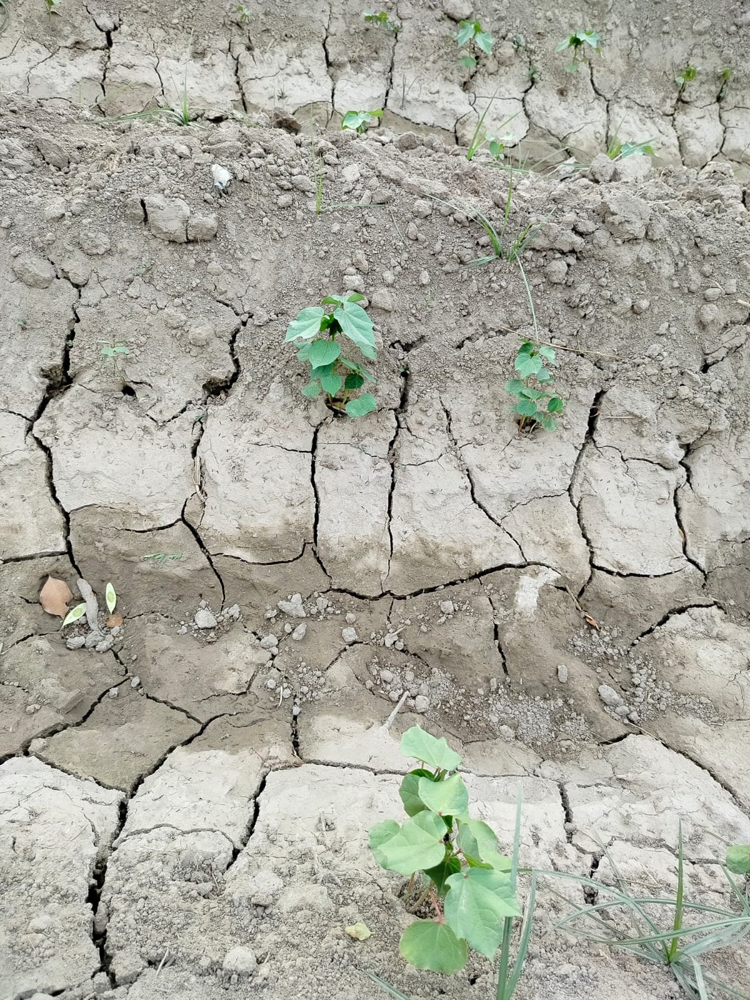

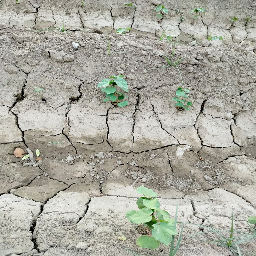

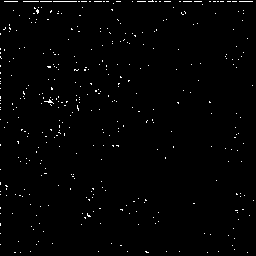

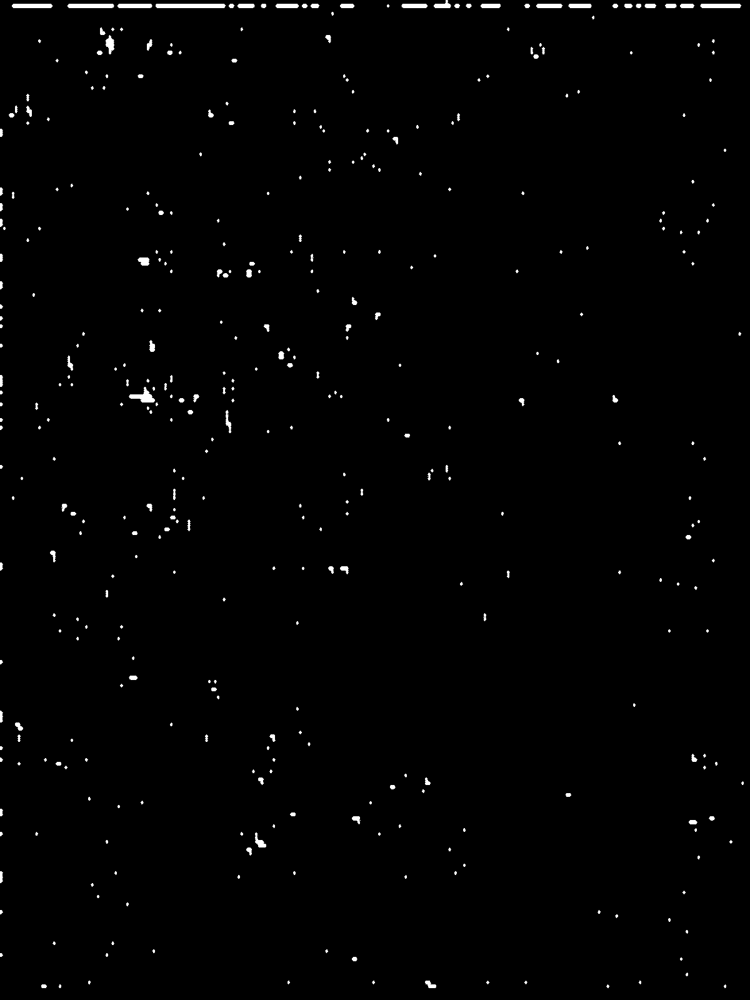

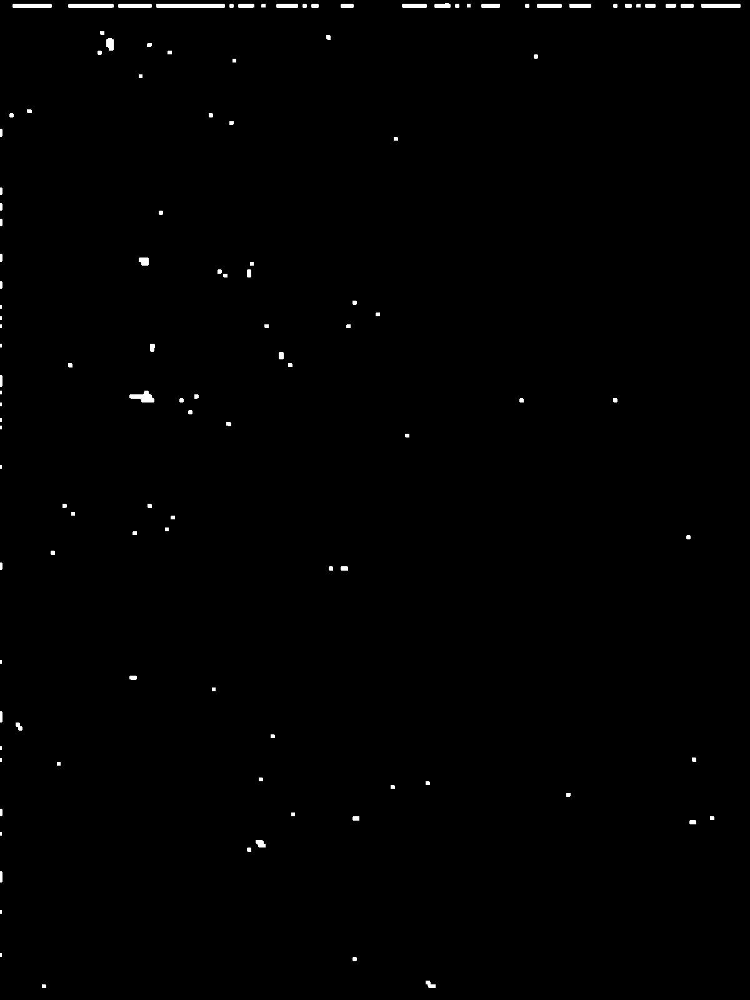

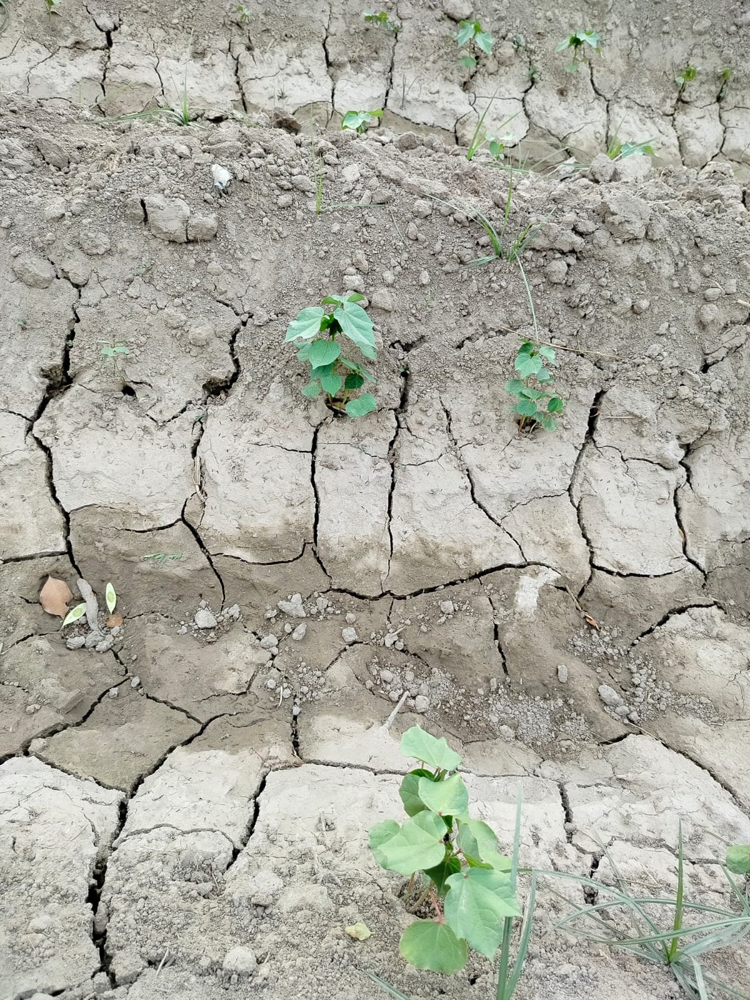

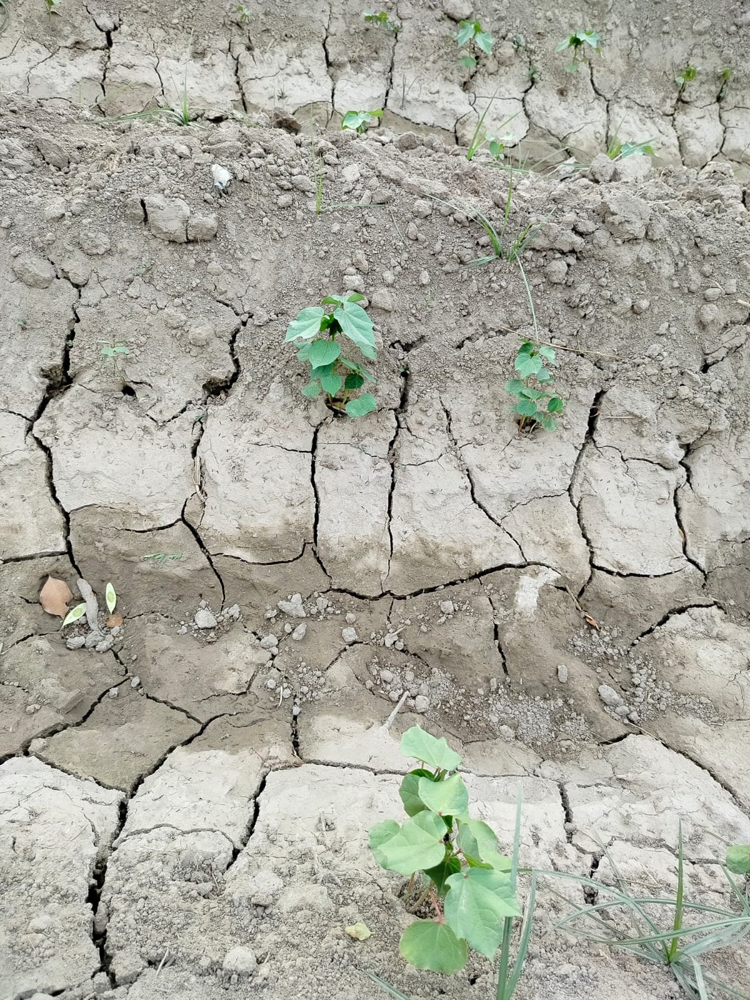

In [3]:
!pip install segmentation-models-pytorch
!pip install --upgrade torch torchvision

import cv2
import numpy as np
import torch
from torchvision import transforms
import segmentation_models_pytorch as smp
from google.colab.patches import cv2_imshow

# Load the segmentation model (e.g., U-Net with a ResNet backbone)
model = smp.Unet(encoder_name='resnet34', encoder_weights='imagenet', in_channels=3, classes=1)
model.eval()  # Set model to evaluation mode

# Function to calculate GSD (Ground Sampling Distance)
def calculate_gsd(drone_height, sensor_width, image_width, focal_length):
    return (drone_height * sensor_width) / (focal_length * image_width)

# Function to calculate real-world distances
def calculate_distance(px_distance, gsd):
    return px_distance * gsd

# Load and preprocess the image
image_path = '2.jpg'
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Image at path {image_path} not found")
image_resized = cv2.resize(image, (256, 256))  # Resize for the model

# Display the original image
cv2_imshow(image)

# Display the resized image
cv2_imshow(image_resized)

# Transform image for the model
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert image to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
image_input = transform(image_resized).unsqueeze(0)  # Add batch dimension

# Predict the segmentation mask
with torch.no_grad():
    mask = model(image_input)[0].squeeze().cpu().numpy()
mask = (mask > 0.5).astype(np.uint8)  # Threshold the mask

# Display the segmentation mask
cv2_imshow(mask * 255)  # Multiply by 255 to show binary mask

mask_resized = cv2.resize(mask, (image.shape[1], image.shape[0]))  # Resize mask to original image size

# Display the resized segmentation mask
cv2_imshow(mask_resized * 255)

# Denoise the mask using morphological operations
kernel = np.ones((5, 5), np.uint8)
mask_cleaned = cv2.morphologyEx(mask_resized, cv2.MORPH_OPEN, kernel)

# Display the cleaned mask
cv2_imshow(mask_cleaned * 255)

# Find contours of the segmented regions
contours, _ = cv2.findContours(mask_cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter out small contours
min_contour_area = 5000  # Set this threshold based on your image size and expected plant size
filtered_contours = [contour for contour in contours if cv2.contourArea(contour) > min_contour_area]

# Calculate centroids
centroids = []
for contour in filtered_contours:
    M = cv2.moments(contour)
    if M['m00'] != 0:
        centroid_x = int(M['m10'] / M['m00'])
        centroid_y = int(M['m01'] / M['m00'])
        centroids.append((centroid_x, centroid_y))

# Display centroids
image_with_centroids = image.copy()
for centroid in centroids:
    cv2.circle(image_with_centroids, (int(centroid[0]), int(centroid[1])), 5, (0, 255, 0), -1)
cv2_imshow(image_with_centroids)

# Parameters (replace with actual values)
drone_height = 200  # Height from which the image was taken (meters)
sensor_width = 12  # Width of the camera sensor (mm)
image_width = image.shape[1]  # Width of the image in pixels
focal_length = 8  # Focal length of the camera (mm)

# Calculate GSD
gsd = calculate_gsd(drone_height, sensor_width, image_width, focal_length)

# Calculate distances between plants
distances = []
for i, (cx1, cy1) in enumerate(centroids):
    for j, (cx2, cy2) in enumerate(centroids[i+1:]):
        px_distance = np.sqrt((cx2 - cx1)**2 + (cy2 - cy1)**2)
        real_distance = calculate_distance(px_distance, gsd)
        distances.append((i, i + j + 1, real_distance))

# Output the distances and draw lines
image_with_distances = image.copy()
for (i, j, distance) in distances:
    print(f"Distance between plant {i} and plant {j}: {distance:.2f} meters")
    cv2.line(image_with_distances, centroids[i], centroids[j], (0, 255, 0), 2)
    mid_point = ((centroids[i][0] + centroids[j][0]) // 2, (centroids[i][1] + centroids[j][1]) // 2)
    cv2.putText(image_with_distances, f"{distance:.2f}m", mid_point, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

# Display the image with distances
cv2_imshow(image_with_distances)
